<a href="https://colab.research.google.com/github/aviramberg276/scout_exp/blob/develop/detectron2_players2205.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Install Detectron:

In [1]:
# install Detectron https://gilberttanner.com/blog/detectron-2-object-detection-with-pytorch
!pip install -U torch==1.4+cu100 torchvision==0.5+cu100 -f https://download.pytorch.org/whl/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu100/index.html

Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 723.9MB 25kB/s 
     |████████████████████████████████| 4.1MB 22.3MB/s 
  Found existing installation: torch 1.5.0+cu101
    Uninstalling torch-1.5.0+cu101:
      Successfully uninstalled torch-1.5.0+cu101
  Found existing installation: torchvision 0.6.0+cu101
    Uninstalling torchvision-0.6.0+cu101:
      Successfully uninstalled torchvision-0.6.0+cu101
     |████████████████████████████████| 276kB 4.9MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44074 sha256=4f15f1c01343ed98b9c59578988c6431281c35baeaf902af572cad26508bea7c
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-b

# Pose Detection with OpenPose

This notebook uses an open source project [CMU-Perceptual-Computing-Lab/openpose](https://github.com/CMU-Perceptual-Computing-Lab/openpose.git) to detect/track multi person poses on a given youtube video.

For other deep-learning Colab notebooks, visit [tugstugi/dl-colab-notebooks](https://github.com/tugstugi/dl-colab-notebooks).


## Install OpenPose

In [0]:
import os
from os.path import exists, join, basename, splitext

git_repo_url = 'https://github.com/CMU-Perceptual-Computing-Lab/openpose.git'
project_name = splitext(basename(git_repo_url))[0]
if not exists(project_name):
  # see: https://github.com/CMU-Perceptual-Computing-Lab/openpose/issues/949
  # install new CMake becaue of CUDA10
  !wget -q https://cmake.org/files/v3.13/cmake-3.13.0-Linux-x86_64.tar.gz
  !tar xfz cmake-3.13.0-Linux-x86_64.tar.gz --strip-components=1 -C /usr/local
  # clone openpose
  !git clone -q --depth 1 $git_repo_url
  !sed -i 's/execute_process(COMMAND git checkout master WORKING_DIRECTORY ${CMAKE_SOURCE_DIR}\/3rdparty\/caffe)/execute_process(COMMAND git checkout f019d0dfe86f49d1140961f8c7dec22130c83154 WORKING_DIRECTORY ${CMAKE_SOURCE_DIR}\/3rdparty\/caffe)/g' openpose/CMakeLists.txt
  # install system dependencies
  !apt-get -qq install -y libatlas-base-dev libprotobuf-dev libleveldb-dev libsnappy-dev libhdf5-serial-dev protobuf-compiler libgflags-dev libgoogle-glog-dev liblmdb-dev opencl-headers ocl-icd-opencl-dev libviennacl-dev
  # install python dependencies
  !pip install -q youtube-dl
  # build openpose
  !cd openpose && rm -rf build || true && mkdir build && cd build && cmake .. && make -j`nproc`
  
from IPython.display import YouTubeVideo

Selecting previously unselected package libgflags2.2.
(Reading database ... 144433 files and directories currently installed.)
Preparing to unpack .../00-libgflags2.2_2.2.1-1_amd64.deb ...
Unpacking libgflags2.2 (2.2.1-1) ...
Selecting previously unselected package libgflags-dev.
Preparing to unpack .../01-libgflags-dev_2.2.1-1_amd64.deb ...
Unpacking libgflags-dev (2.2.1-1) ...
Selecting previously unselected package libgoogle-glog0v5.
Preparing to unpack .../02-libgoogle-glog0v5_0.3.5-1_amd64.deb ...
Unpacking libgoogle-glog0v5 (0.3.5-1) ...
Selecting previously unselected package libgoogle-glog-dev.
Preparing to unpack .../03-libgoogle-glog-dev_0.3.5-1_amd64.deb ...
Unpacking libgoogle-glog-dev (0.3.5-1) ...
Selecting previously unselected package libhdf5-serial-dev.
Preparing to unpack .../04-libhdf5-serial-dev_1.10.0-patch1+docs-4_all.deb ...
Unpacking libhdf5-serial-dev (1.10.0-patch1+docs-4) ...
Selecting previously unselected package libleveldb1v5:amd64.
Preparing to unpack ...

## Detect poses on a test video

We are going to detect poses on the following youtube video:

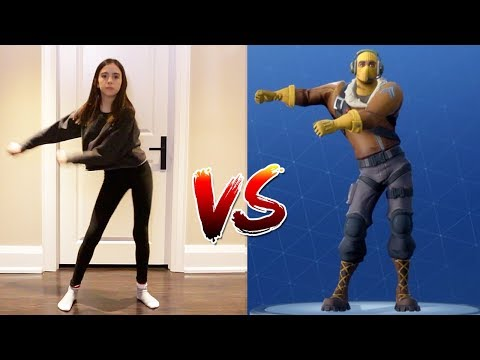

In [0]:
YOUTUBE_ID = 'RXABo9hm8B8'


YouTubeVideo(YOUTUBE_ID)

Download the above youtube video, cut the first 5 seconds and do the pose detection on that 5 seconds:

In [0]:
!rm -rf youtube.mp4
# download the youtube with the given ID
!youtube-dl -f 'bestvideo[ext=mp4]' --output "youtube.%(ext)s" https://www.youtube.com/watch?v=$YOUTUBE_ID
# cut the first 5 seconds
!ffmpeg -y -loglevel info -i youtube.mp4 -t 5 video.mp4
# detect poses on the these 5 seconds
!rm openpose.avi
!cd openpose && ./build/examples/openpose/openpose.bin --video ../video.mp4 --write_json ./output/ --display 0  --write_video ../openpose.avi
# convert the result into MP4
!ffmpeg -y -loglevel info -i openpose.avi output.mp4

[youtube] RXABo9hm8B8: Downloading webpage
[download] Destination: youtube.mp4
[download] 100% of 116.25MiB in 00:01
ffmpeg version 3.4.6-0ubuntu0.18.04.1 Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.3.0-16ubuntu3)
  configuration: --prefix=/usr --extra-version=0ubuntu0.18.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-li

Finally, visualize the result:

In [0]:
def show_local_mp4_video(file_name, width=640, height=480):
  import io
  import base64
  from IPython.display import HTML
  video_encoded = base64.b64encode(io.open(file_name, 'rb').read())
  return HTML(data='''<video width="{0}" height="{1}" alt="test" controls>
                        <source src="data:video/mp4;base64,{2}" type="video/mp4" />
                      </video>'''.format(width, height, video_encoded.decode('ascii')))

show_local_mp4_video('output.mp4', width=960, height=720)

FileNotFoundError: ignored

In [0]:
# https://github.com/krematas/soccerontable

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2 import model_zoo
import cv2
import os
import numpy as np
from google.colab.patches import cv2_imshow

In [0]:
vidcap = cv2.VideoCapture('/content/drive/My Drive/Colab Notebooks/data/soccer/cutvideo.mp4')
success,image = vidcap.read()
width = vidcap.get(cv2.CAP_PROP_FRAME_WIDTH)
height = vidcap.get(cv2.CAP_PROP_FRAME_HEIGHT)
fourcc1 = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('/content/drive/My Drive/Colab Notebooks/data/soccer/detectron_out.avi', fourcc1, 20.0,  (int(width),int(height)))

In [0]:
count = 0
success = True
idx = 0
cfg = get_cfg()
cfg.merge_from_file("./detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"
predictor = DefaultPredictor(cfg)

AssertionError: ignored

In [4]:
cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
# outputs = predictor(im)

model_final_f10217.pkl: 178MB [00:02, 67.7MB/s]                           


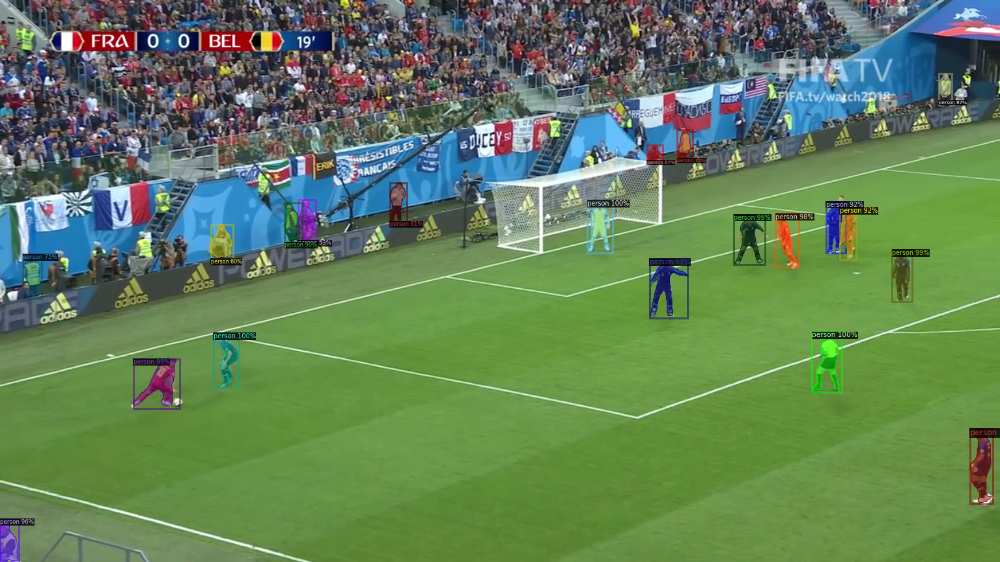

In [0]:
while success:
  outputs = predictor(image)
  v = Visualizer(image[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
  v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(v.get_image()[:, :, ::-1])
  out.write(v.get_image()[:, :, ::-1])
  count += 1
  # cv2.imshow('Match Detection',image)
  # checking wheather we got interupt from the user the close the image.
  # cv2.imwrite("/content/frame%d.jpg" % count, res)
  if cv2.waitKey(1) & 0xFF == ord('q'):
    break
  success,image = vidcap.read()
  break
  
vidcap.release()
out.release()
cv2.waitKey(5)
cv2.destroyAllWindows()

In [0]:
from detectron2.utils.video_visualizer import VideoVisualizer
from detectron2.data import MetadataCatalog
from detectron2.utils.visualizer import ColorMode, Visualizer
video_visualizer = VideoVisualizer(MetadataCatalog.get(
            cfg.DATASETS.TEST[0] if len(cfg.DATASETS.TEST) else "__unused"
        ))#self.metadata, ColorMode.IMAGE)
video = cv2.VideoCapture('/content/drive/My Drive/Colab Notebooks/data/soccer/cutvideo.mp4')
# video = cv2.VideoCapture(args.video_input)
# fourcc1 = cv2.VideoWriter_fourcc(*'XVID')
width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
frames_per_second = video.get(cv2.CAP_PROP_FPS)
num_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))
output_file = cv2.VideoWriter(
                '/content/drive/My Drive/Colab Notebooks/data/soccer/detectron_test3_out.avi',
                # some installation of opencv may not support x264 (due to its license),
                # you can try other format (e.g. MPEG)
                fourcc=cv2.VideoWriter_fourcc(*'XVID'),
                fps=float(frames_per_second),
                frameSize=(width, height),
                isColor=True,
            )

count = 0
# success = True
idx = 0
success,image = video.read()
first = image 
while success:
  # print(count)
  predictions = predictor(image)
  

  image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
  if "panoptic_seg" in predictions:
      panoptic_seg, segments_info = predictions["panoptic_seg"]
      vis_frame = video_visualizer.draw_panoptic_seg_predictions(
          image, panoptic_seg.to("cpu"), segments_info
      )
  elif "instances" in predictions:
      predictions = predictions["instances"].to("cpu")
      vis_frame = video_visualizer.draw_instance_predictions(image, predictions)
  elif "sem_seg" in predictions:
      vis_frame = video_visualizer.draw_sem_seg(
          image, predictions["sem_seg"].argmax(dim=0).to("cpu")
      )


  
  # v = Visualizer(image[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
  # v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  # cv2.cvtColor(v.get_image(), cv2.COLOR_RGB2BGR)
  # cv2_imshow(v.get_image()[:, :, ::-1])
  output_file.write(cv2.cvtColor(vis_frame.get_image(), cv2.COLOR_RGB2BGR))
  count += 1
  # cv2.imshow('Match Detection',image)
  # checking wheather we got interupt from the user the close the image.
  # cv2.imwrite("/content/frame%d.jpg" % count, res)
  if cv2.waitKey(1) & 0xFF == ord('q'):
    break
  success,image = video.read()
  break
  
video.release()
output_file.release()
cv2.waitKey(5)
cv2.destroyAllWindows()

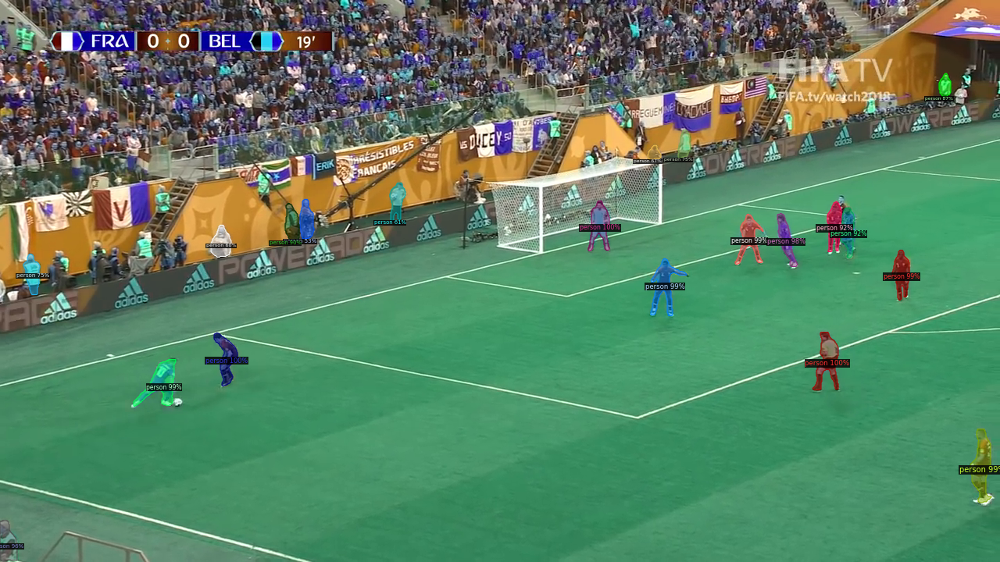

In [8]:
cv2_imshow(vis_frame.get_image())

In [0]:
# predictions = predictor(image)
classes=predictions["instances"].to("cpu").pred_classes.cpu().numpy()
bbox=predictions["instances"].to("cpu").pred_boxes.tensor.cpu().numpy()
#identity only persons 
ind = np.where(classes==0)[0]

#identify bounding box of only persons
person=bbox[ind]

#total no. of persons
num= len(person)

In [21]:
x1,y1,x2,y2 = person[0]
print(x1,y1,x2,y2)
# _ = cv2.rectangle(img, (x1, y1), (x2, y2), (255,0,0), 2)

1033.3123 426.16003 1075.2596 504.70264


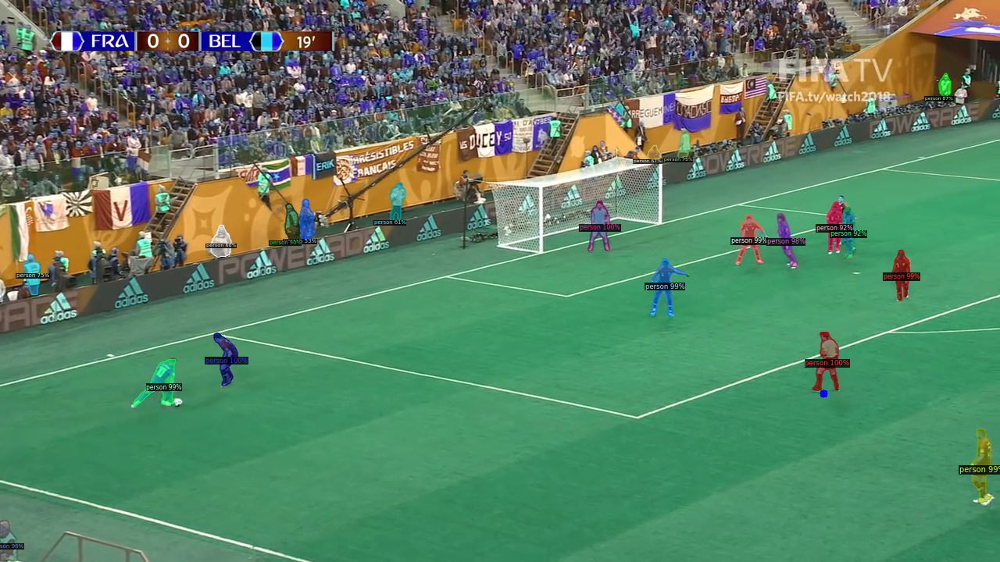

In [22]:
img = vis_frame.get_image()
x_center = int((x1+x2)/2)
y_center = int(y2)

center = (x_center, y_center)

_ = cv2.circle(img, center, 5, (255, 0, 0), -1)
cv2_imshow(img)

In [0]:

#define a function which return the bottom center of every bbox
def mid_point(img,person,idx):
  #get the coordinates
  x1,y1,x2,y2 = person[idx]
  _ = cv2.rectangle(img, (x1, y1), (x2, y2), (0,0,255), 2)
  
  #compute bottom center of bbox
  x_mid = int((x1+x2)/2)
  y_mid = int(y2)
  mid   = (x_mid,y_mid)
  
  _ = cv2.circle(img, mid, 5, (0, 0, 255), -1)
  cv2.putText(img, str(idx), mid, cv2.FONT_HERSHEY_SIMPLEX,1, (255, 255, 255), 2, cv2.LINE_AA)
  
  return mid

In [0]:
from scipy.spatial import distance
def compute_distance(midpoints,num):
  dist = np.zeros((num,num))
  for i in range(num):
    for j in range(i+1,num):
      if i!=j:
        dst = distance.euclidean(midpoints[i], midpoints[j])
        dist[i][j]=dst
  return dist

In [0]:
midpoints = [mid_point(img,person,i) for i in range(len(person))]
dist= compute_distance(midpoints,num)

In [0]:
def find_closest(dist,num,thresh):
  p1=[]
  p2=[]
  d=[]
  for i in range(num):
    for j in range(i,num):
      if( (i!=j) & (dist[i][j]<=thresh)):
        p1.append(i)
        p2.append(j)
        d.append(dist[i][j])
  return p1,p2,d

In [42]:
import pandas as pd

thresh=86
p1,p2,d=find_closest(dist,num,thresh)
df = pd.DataFrame({"p1":p1,"p2":p2,"dist":d})
df

,p1,p2,dist
0,5,6,85.702975
1,7,8,46.043458
2,8,9,65.000000
3,8,10,81.884064
4,9,10,18.439089
5,16,19,39.051248
6,19,20,84.291162


In [0]:
def change_2_red(img,person,p1,p2):
  risky = np.unique(p1+p2)
  for i in risky:
    x1,y1,x2,y2 = person[i]
    _ = cv2.rectangle(img, (x1, y1), (x2, y2), (255,0,0), 2)  
  return img

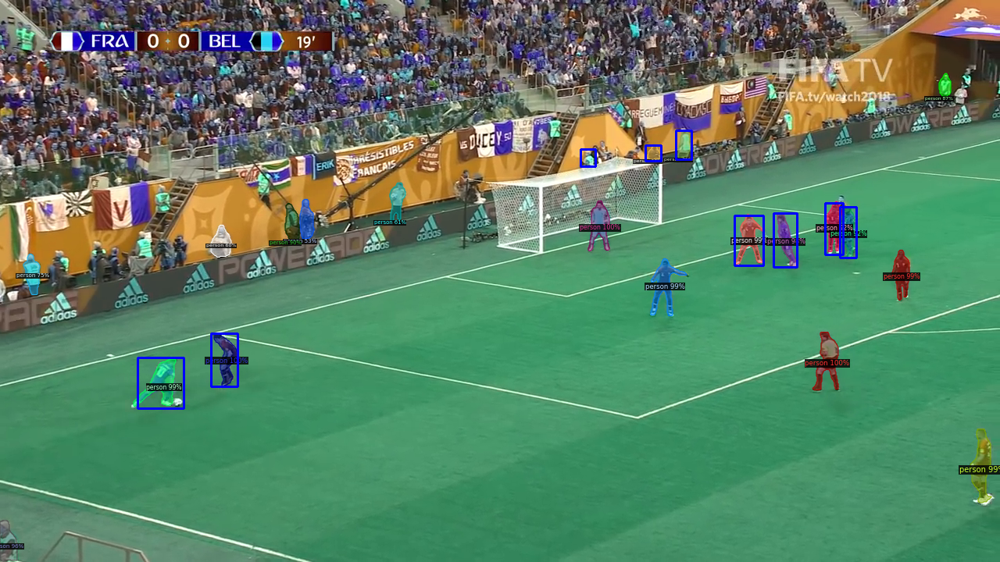

In [43]:

cv2_imshow(change_2_red(vis_frame.get_image(),person,p1,p2))

In [55]:
img

array([[[175, 191, 191],
        [171, 187, 187],
        [169, 185, 185],
        ...,
        [ 65, 132, 207],
        [ 65, 132, 207],
        [ 65, 132, 207]],

       [[170, 186, 186],
        [177, 193, 193],
        [170, 186, 186],
        ...,
        [ 65, 132, 207],
        [ 65, 132, 207],
        [ 65, 132, 207]],

       [[152, 168, 168],
        [169, 185, 185],
        [178, 194, 194],
        ...,
        [ 65, 132, 207],
        [ 65, 132, 207],
        [ 65, 132, 207]],

       ...,

       [[  0,   0, 255],
        [  0,   0, 255],
        [ 96, 102, 100],
        ...,
        [ 94, 134,  55],
        [ 94, 134,  55],
        [ 94, 134,  55]],

       [[  0,   0, 255],
        [  0,   0, 255],
        [  0,   0, 255],
        ...,
        [ 92, 132,  53],
        [ 92, 132,  53],
        [ 92, 132,  53]],

       [[  0,   0, 255],
        [  0,   0, 255],
        [  0,   0, 255],
        ...,
        [ 92, 132,  53],
        [ 92, 132,  53],
        [ 92, 132,  53]]

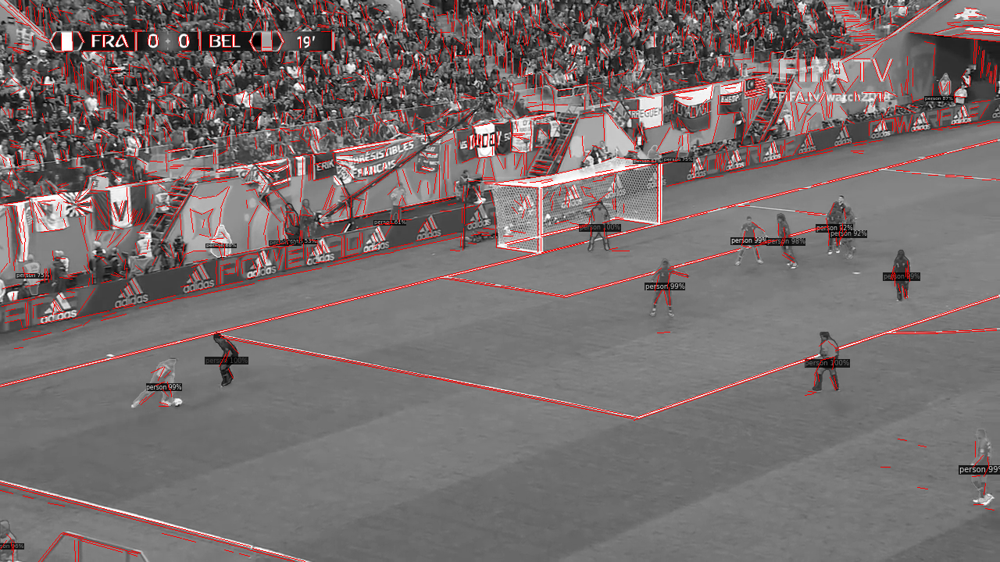

In [58]:
img = vis_frame.get_image()
fld = cv2.ximgproc.createFastLineDetector()
grayimg = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
lines = fld.detect(grayimg)
result_img = fld.drawSegments(img,lines)
cv2_imshow(img)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:49: RuntimeWarning: divide by zero encountered in int_scalars


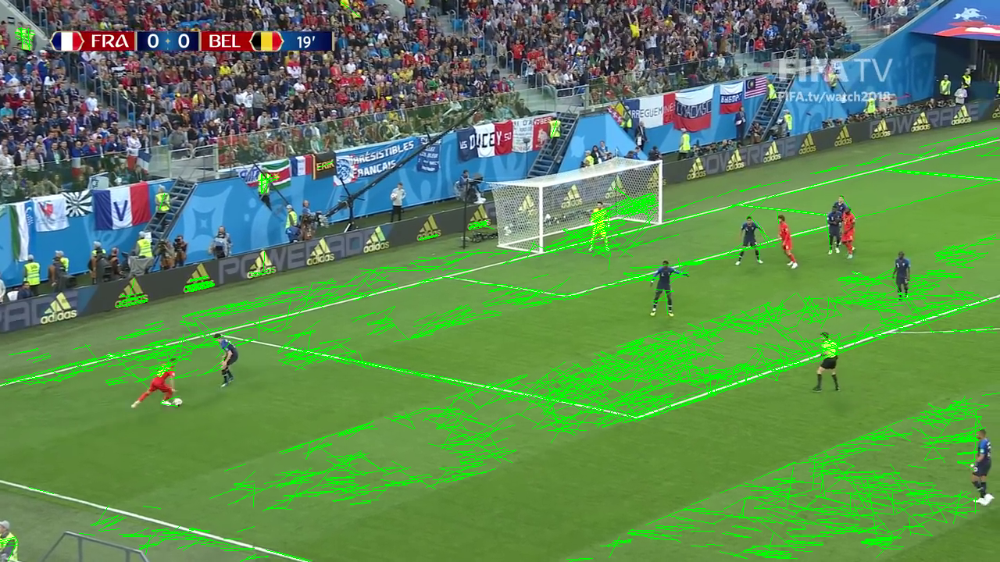

In [100]:
img = first
low_threshold = np.array([0,90,0], dtype=np.uint8)
high_threshold = np.array([170,255,255], dtype=np.uint8) 


mask1 = cv2.inRange(img, low_threshold, high_threshold)
# cv2.imshow("mask1",mask1)

l_threshold = np.array([0, 115, 0], dtype=np.uint8)
h_threshold = np.array([75, 147, 172], dtype=np.uint8) 

mask2=cv2.inRange(img, low_threshold , high_threshold)
# cv2.imshow("mask2",mask2)
and1=cv2.bitwise_and(img,img,mask=mask1)
# cv2.imshow("and1",and1)

and2=cv2.bitwise_and(and1,and1,mask=mask2)
# cv2.imshow("and2",and2)

lowest=np.array([73, 145, 45], dtype=np.uint8)
highest=np.array([114, 255, 255], dtype=np.uint8)

mask3=cv2.inRange(and2, lowest , highest)
# cv2.imshow("and3",mask3)
and3=cv2.bitwise_and(and2,and2,mask=mask3)
# cv2.imshow("and3",and3)
gray=cv2.cvtColor(and3,cv2.COLOR_BGR2GRAY)
# cv2.imshow("gray",gray)

gaussian=cv2.GaussianBlur(gray, (3, 3), 5)
# cv2.imshow("gaussian",gaussian)

edge=cv2.Canny(gaussian, 10, 150)
# cv2.imshow("edge",edge)

rho = 1

# 1 degree
theta = (np.pi/180) * 1
threshold = 15
min_line_length = 20
max_line_gap = 10

lines=cv2.HoughLinesP(edge, rho, theta, threshold, np.empty(0),
minLineLength=min_line_length, maxLineGap=max_line_gap)
for line in lines:
  for x1,y1,x2,y2 in line:
    cv2.line(img, (x1, y1), (x2, y2), [0,255,0], 1)
    m=(y2-y1)/(x2-x1)
    # print ("y="+str(round(m,2))+ "x+"+str(y2-y1))

cv2_imshow(img)

In [0]:
# https://vgg.fiit.stuba.sk/2015-04/detection-of-objects-in-soccer/

In [46]:
# https://github.com/luncf/line-segment-detector
!pwd
!git clone https://github.com/luncf/line-segment-detector.git

/content
Cloning into 'line-segment-detector'...
remote: Enumerating objects: 28, done.
remote: Total 28 (delta 0), reused 0 (delta 0), pack-reused 28
Unpacking objects: 100% (28/28), done.


In [50]:
!cd ./line-segment-detector/
!python ./line-segment-detector/src/vision.py

Traceback (most recent call last):
  File "./line-segment-detector/src/vision.py", line 6, in <module>
    from line_segment_detection import LineSegmentDetector
  File "/content/line-segment-detector/src/line_segment_detection.py", line 100, in <module>
    class LineSegmentDetector(CVMat):
  File "/content/line-segment-detector/src/line_segment_detection.py", line 101, in LineSegmentDetector
    __OPENCV_LSD = cv.createLineSegmentDetector(_refine=cv.LSD_REFINE_STD)
cv2.error: OpenCV(4.1.2) /io/opencv/modules/imgproc/src/lsd.cpp:143: error: (-213:The function/feature is not implemented) Implementation has been removed due original code license issues in function 'LineSegmentDetectorImpl'



In [0]:
from bisect import insort
from enum import Enum
import math
import sys

import cv2 as cv
class CVMat(object):

    BLACK = (0, 0, 0)
    WHITE = (255, 255, 255)

    def __init__(self, frame, width=0, height=0):
        self.frame = frame #self.resize(frame, width=width, height=height) if width > 0 or height > 0 else frame
        self.colour_space_frame = cv.cvtColor(self.frame, code=cv.COLOR_BGR2LAB)

    def clone(self):
        return copy.deepcopy(self)

    @staticmethod
    def resize(frame, width=0, height=0):
        # Resize an image based on the given width OR height
        # Will choose width if both width and height are given

        (_height, _width) = frame.shape[:2]

        if width > 0:
            ratio = width / float(_width)
            _width = width
            _height = int(round(_height * ratio))
        elif height > 0:
            ratio = height / float(_height)
            _width = int(round(_width * ratio))
            _height = height

        return cv.resize(frame, (_width, _height), interpolation=cv.INTER_AREA)

    def background_mask(self, thresh_lb, thresh_ub, min_area, line_width=40):
        # Blur and threshold the original image
        self.frame = cv.GaussianBlur(self.colour_space_frame, ksize=(25, 25), sigmaX=0)
        self.frame = cv.inRange(self.frame, lowerb=thresh_lb, upperb=thresh_ub)

        # Remove any noise
        kernel_ellipse_3 = cv.getStructuringElement(cv.MORPH_ELLIPSE, (3, 3))
        self.frame = cv.morphologyEx(self.frame, op=cv.MORPH_OPEN, kernel=kernel_ellipse_3)
        self.frame = cv.morphologyEx(self.frame, op=cv.MORPH_CLOSE, kernel=kernel_ellipse_3)

        # Find contours that fulfill the min_area requirement
        _, contours, _ = cv.findContours(self.frame, mode=cv.RETR_EXTERNAL, method=cv.CHAIN_APPROX_SIMPLE)
        contours = [contour for contour in contours if cv.contourArea(contour) > min_area] if contours else None

        # Create a blank frame and fill in the contours
        self.frame = np.zeros(self.frame.shape[:2], dtype=np.uint8)
        if contours:
            cv.fillPoly(self.frame, pts=contours, color=self.WHITE)

            # Morph close to fill in the lines
            self.frame = cv.morphologyEx(self.frame, cv.MORPH_CLOSE,
                                         cv.getStructuringElement(cv.MORPH_RECT, (line_width, line_width)))

        # Remove any remaining noise
        self.frame = cv.morphologyEx(self.frame, cv.MORPH_OPEN, cv.getStructuringElement(cv.MORPH_ELLIPSE, (10, 10)))

    def extract_object(self, thresh_lb, thresh_ub, field=None, kernel_size=3):
        # Blur and threshold the original image
        blur = cv.GaussianBlur(self.colour_space_frame, ksize=(5, 5), sigmaX=0)
        threshold = cv.inRange(blur, lowerb=thresh_lb, upperb=thresh_ub)

        # Apply field mask if given
        self.frame = cv.bitwise_and(field, field, mask=threshold) if field is not None else threshold

        # Remove any noise
        kernel_ellipse = cv.getStructuringElement(cv.MORPH_ELLIPSE, (kernel_size, kernel_size))
        self.frame = cv.morphologyEx(self.frame, op=cv.MORPH_OPEN, kernel=kernel_ellipse)
        self.frame = cv.morphologyEx(self.frame, op=cv.MORPH_CLOSE, kernel=kernel_ellipse)
# from cv_mat import CVMat


class LineSegment(object):

    def __init__(self, x1, y1, x2, y2):
        pts = sorted([(x1, y1), (x2, y2)], key=lambda pt: pt[0])
        self.x1 = pts[0][0]
        self.y1 = pts[0][1]
        self.x2 = pts[1][0]
        self.y2 = pts[1][1]
        self.length = self.length(x1=self.x1, y1=self.y1, x2=self.x2, y2=self.y2)
        self.angle = self.angle()

    def __lt__(self, other_line_segment):
        return self.length < other_line_segment.length

    def distance_to_point(self, pt_x=0, pt_y=0):
        t = -((self.x1 - pt_x) * (self.x2 - self.x1) + (self.y1 - pt_y) * (self.y2 - self.y1)) / \
            (math.pow(self.x2 - self.x1, 2) + math.pow(self.y2 - self.y1, 2))

        if 0 <= t <= 1:
            distance = math.fabs((self.x2 - self.x1) * (self.y1 - pt_y) - (self.y2 - self.y1) * (self.x1 - pt_x)) / \
                math.sqrt(math.pow(self.x2 - self.x1, 2) + math.pow(self.y2 - self.y1, 2))
        else:
            distance = min(math.sqrt(math.pow(self.x1 - pt_x, 2) + math.pow(self.y1 - pt_y, 2)),
                           math.sqrt(math.pow(self.x2 - pt_x, 2) + math.pow(self.y2 - pt_y, 2)))

        return distance

    def to_cv_line(self):
        return (self.to_pixel_value(self.x1), self.to_pixel_value(self.y1)), \
               (self.to_pixel_value(self.x2), self.to_pixel_value(self.y2))

    def angle(self):
        angle = math.atan2((self.y2 - self.y1), (self.x2 - self.x1))

        if self.x2 != self.x1 and (self.y2 - self.y1) / (self.x2 - self.x1) < 0:
            angle = -math.fabs(angle)

        return angle

    @staticmethod
    def distance(x1, y1, x2=0, y2=0):
        return math.sqrt(math.pow(math.fabs(x2 - x1), 2) + math.pow(math.fabs(y2 - y1), 2))

    @staticmethod
    def length(x1, y1, x2, y2):
        return LineSegment.distance(x1=x1, y1=y1, x2=x2, y2=y2)

    @staticmethod
    def to_pixel_value(pt):
        return max(0, int(round(pt)))


class Corner(object):

    CornerType = Enum('CornerType', 'l_shape, t_shape')

    def __init__(self, x, y, line1, line2=None):
        self.x = x
        self.y = y

        if line2 is not None:
            min_line = min(line1, line2, key=lambda line: line.length)
            max_line = line1 if min_line == line2 else line2
        else:
            min_line = line1
            max_line = None

        self.line1 = min_line
        self.line2 = max_line


class FieldLines(object):

    def __init__(self, lines, l_corners=0, t_corners=0):
        self.lines = lines
        self.l_corners = l_corners
        self.t_corners = t_corners

    def add_l_corner(self, line):
        self.lines += [line]
        self.l_corners += 1

    def add_t_corner(self):
        self.t_corners += 1

    def has_line(self, line):
        return line in self.lines


class LineSegmentDetector(CVMat):
    __OPENCV_LSD = cv2.ximgproc.createFastLineDetector()#cv.createLineSegmentDetector(_refine=cv.LSD_REFINE_STD)

    def __init__(self, frame):
        CVMat.__init__(self, frame=frame)
        self.line_segments = []
        self.horizontal = []
        self.vertical = []
        self.field_lines = []
        self.extra_lines = []

    def extract_lines(self, thresh_lb, thresh_ub, field):
        self.extract_object(thresh_lb=thresh_lb, thresh_ub=thresh_ub, field=field, kernel_size=3)

    @staticmethod
    def __filter_by_length(lines, min_length=-1):
        # Return only lines that are longer than min_length
        filtered_lines = []

        for line in lines:
            if LineSegment.length(x1=line[0, 0], y1=line[0, 1], x2=line[0, 2], y2=line[0, 3]) > min_length:
                insort(filtered_lines, LineSegment(x1=line[0, 0], y1=line[0, 1], x2=line[0, 2], y2=line[0, 3]))
        filtered_lines.reverse()

        return filtered_lines

    @staticmethod
    def __categorize_by_angle(lines):
        horizontal = []
        vertical = []

        if len(lines) > 0:
            # Find the average of the min_angle and max_angle, use that to offset the x-axis
            max_angle = max(line.angle for line in lines)
            min_angle = min(line.angle for line in lines)
            min_max_average = (math.fabs(max_angle) + math.fabs(min_angle)) / 2.0
            x_axis_offset = math.pi / 4 if min_max_average > math.pi / 3 else 0

            for line in lines:
                angle = line.angle if x_axis_offset == 0 else math.fabs(line.angle)
                if angle > x_axis_offset:
                    vertical += [line]
                else:
                    horizontal += [line]

        return horizontal, vertical

    @staticmethod
    def __categorize_by_distance_apart(lines, max_distance_apart, frame_height):
        categorize_distance = []

        for line in lines:
            closest_group_index = None
            shortest_distance_apart = sys.maxsize

            # Find a group for the line based on the shortest distance existing grouped lines
            for group_index, group in enumerate(categorize_distance):
                for reference_line in group:
                    distance_apart = min(reference_line.distance_to_point(pt_x=line.x1, pt_y=line.y1),
                                         reference_line.distance_to_point(pt_x=line.x2, pt_y=line.y2),
                                         line.distance_to_point(pt_x=reference_line.x1, pt_y=reference_line.y1),
                                         line.distance_to_point(pt_x=reference_line.x2, pt_y=reference_line.y2))

                    # Calculate a new max_distance_apart based on the average value of y
                    # bottom of image --> larger y --> line segments further apart
                    average_y = (line.y1 + line.y2 + reference_line.y1 + reference_line.y2) / 4.0
                    distance_apart_threshold = 1 + average_y / frame_height / 2

                    if distance_apart < shortest_distance_apart and \
                            distance_apart < max_distance_apart * distance_apart_threshold:
                        closest_group_index = group_index
                        shortest_distance_apart = distance_apart

            # Group two lines together if a grouping was found, otherwise, start a new group
            if closest_group_index is not None:
                categorize_distance[closest_group_index] += [line]
            else:
                categorize_distance += [[line]]

        return categorize_distance

    @staticmethod
    def __merge_grouped_lines__(groups):
        merged_lines = []

        # Find the average of the lines in the group
        # Create a new line based on the average
        for group in groups:
            if len(group) > 1:
                x_coordinates = []
                y_coordinates = []
                average_angle = 0

                for line in group:
                    x_coordinates += [line.x1, line.x2]
                    y_coordinates += [line.y1, line.y2]
                    average_angle += line.angle

                min_x = min(x_coordinates)
                max_x = max(x_coordinates)
                min_y = min(y_coordinates)
                max_y = max(y_coordinates)
                angle = average_angle / len(group)

                if angle > 0:
                    merged_lines += [LineSegment(x1=min_x, y1=min_y, x2=max_x, y2=max_y)]
                else:
                    merged_lines += [LineSegment(x1=min_x, y1=max_y, x2=max_x, y2=min_y)]

        return merged_lines

    def lsd(self, max_distance_apart=10, min_length=15):
        # Find all line segment with OpenCV's LSD
        lines = self.__OPENCV_LSD.detect(cv2.cvtColor(self.frame, cv2.COLOR_BGR2GRAY))

        if lines is not None:
            # Filter out lines that do not meet min_length condition
            self.line_segments = self.__filter_by_length(lines, min_length=min_length)

            # Classify the lines by angle
            horizontal, vertical = self.__categorize_by_angle(self.line_segments)

            # Classify the lines by distance apart
            horizontal = self.__categorize_by_distance_apart(horizontal, max_distance_apart, self.frame.shape[0])
            vertical = self.__categorize_by_distance_apart(vertical, max_distance_apart, self.frame.shape[0])

            # Find average line in classified groups
            horizontal = self.__merge_grouped_lines__(horizontal)
            vertical = self.__merge_grouped_lines__(vertical)

            self.horizontal = horizontal
            self.vertical = vertical

    @staticmethod
    def classify_corner_shape(line, point, max_distance_apart):
        # Determine whether corner is L shaped or T shaped
        distance_apart = min(LineSegment.distance(x1=line.x1, y1=line.y1, x2=point[0], y2=point[1]),
                             LineSegment.distance(x1=line.x2, y1=line.y2, x2=point[0], y2=point[1]))

        return Corner.CornerType.l_shape if distance_apart <= max_distance_apart else Corner.CornerType.t_shape

    @staticmethod
    def __find_corners(lines, reference_lines, max_distance_apart):
        l_shape_corners = []
        t_shape_corners = []

        remaining_reference_lines = list(reference_lines)

        for reference_line in reference_lines:
            for line in lines:
                distance_pt1 = reference_line.distance_to_point(pt_x=line.x1, pt_y=line.y1)
                distance_pt2 = reference_line.distance_to_point(pt_x=line.x2, pt_y=line.y2)
                distance_apart = min(distance_pt1, distance_pt2)

                # Find the shortest distance between the reference line and two endpoints of line
                # Classify as corner if distance_apart is shorter than max_distance_apart
                if distance_apart < max_distance_apart:
                    (pt_x, pt_y) = (line.x1, line.y1) if distance_apart == distance_pt1 else (line.x2, line.y2)
                    corner_type = LineSegmentDetector.classify_corner_shape(line=reference_line, point=(pt_x, pt_y),
                                                                            max_distance_apart=max_distance_apart)
                    if corner_type == Corner.CornerType.l_shape:
                        l_shape_corners += [Corner(x=pt_x, y=pt_y, line1=line, line2=reference_line)]
                        if reference_line in remaining_reference_lines:
                            remaining_reference_lines.remove(reference_line)
                    else:
                        t_shape_corners += [Corner(x=pt_x, y=pt_y, line1=reference_line)]
                        if reference_line in remaining_reference_lines:
                            remaining_reference_lines.remove(reference_line)

        return l_shape_corners, t_shape_corners, remaining_reference_lines

    def find_corners(self, max_distance_apart=5):
        self.field_lines = []

        # Find all possible T and L shape corners
        horizontal_l_shape, horizontal_t_shape, extra_vertical = self.__find_corners(lines=self.horizontal,
                                                                                     reference_lines=self.vertical,
                                                                                     max_distance_apart=max_distance_apart)
        vertical_l_shape, vertical_t_shape, extra_horizontal = self.__find_corners(lines=self.vertical,
                                                                                   reference_lines=self.horizontal,
                                                                                   max_distance_apart=max_distance_apart)

        # Merge L shape corners
        l_shape_corners = []
        for horizontal in horizontal_l_shape:
            for vertical in vertical_l_shape:
                distance_apart = LineSegment.distance(x1=horizontal.x, y1=horizontal.y, x2=vertical.x, y2=vertical.y)
                if distance_apart < max_distance_apart:
                    found_matching_line = False

                    for existing_l_shape in l_shape_corners:
                        if existing_l_shape.has_line(horizontal.line1):
                            existing_l_shape.add_l_corner(horizontal.line2)
                            found_matching_line= True
                        elif existing_l_shape.has_line(horizontal.line2):
                            existing_l_shape.add_l_corner(horizontal.line1)
                            found_matching_line = True

                    if not found_matching_line:
                        l_shape_corners += [FieldLines(lines=[horizontal.line1, horizontal.line2], l_corners=1)]

        # Merge T shape corners
        t_shape_corners = []
        for corner in horizontal_t_shape + vertical_t_shape:
            found_matching_line = False

            for existing_t_shape in t_shape_corners:
                if existing_t_shape.has_line(corner.line1):
                    existing_t_shape.add_t_corner()
                    found_matching_line = True

            if not found_matching_line:
                t_shape_corners += [FieldLines(lines=[corner.line1], t_corners=1)]

        # Merge T shape corners with L shape corners into lines
        for l_shape in l_shape_corners:
            for t_shape in list(t_shape_corners):
                if l_shape.has_line(t_shape.lines[0]):
                    l_shape.add_t_corner()
                    t_shape_corners.remove(t_shape)

        self.field_lines = l_shape_corners + t_shape_corners
        self.extra_lines = extra_horizontal + extra_vertical

    def classify_lines(self):
        boundary_line = []
        goal_area_line = []
        center_line = []
        undefined_lines = []

        # Lines with T corners must be boundary
        if len(self.field_lines) > 0:
            self.field_lines = sorted(self.field_lines, key=lambda line: line.t_corners, reverse=True)
            if 0 < self.field_lines[0].t_corners <= 2:
                boundary_line += self.field_lines.pop(0).lines

        # Lines with L corners can be boundary or goal area
        if len(self.field_lines) > 0:
            self.field_lines = sorted(self.field_lines, key=lambda line: line.l_corners, reverse=True)
            l_corner_lines = [line for line in self.field_lines if line.l_corners > 0]

            if len(l_corner_lines) > 0:
                if len(boundary_line) > 0:
                    # This L corner must be a goal area since we already have a boundary
                    goal_area_line += self.field_lines.pop(0).lines
                elif len(l_corner_lines) == 2:
                    # The top corner point must be the boundary
                    # The bottom corner point must be the goal area
                    line0_y = []
                    for line in l_corner_lines[0].lines:
                        line0_y += [line.y1, line.y2]
                    line0_y = sorted(line0_y)
                    line1_y = []
                    for line in l_corner_lines[1].lines:
                        line1_y += [line.y1, line.y2]
                    line1_y = sorted(line1_y)

                    if line0_y[0] < line1_y[0]:
                        boundary_line += self.field_lines.pop(0).lines
                        goal_area_line += self.field_lines.pop(0).lines
                    else:
                        goal_area_line += self.field_lines.pop(0).lines
                        boundary_line += self.field_lines.pop(0).lines

            # Lines that are left over are unknown
            for line in self.field_lines:
                undefined_lines += line.lines

        undefined_lines += self.extra_lines

        return {
            'boundary': boundary_line, 'goal_area': goal_area_line, 'center': center_line, 'undefined': undefined_lines
        }

In [0]:
import json
from collections import namedtuple
data =  '''{
    "corner_max_distance_apart": 20,
    "max_distance_apart": 20, 
    "max_width": 20,
    "min_length": 20, 
    "output_boundary_line_colour": [
      255, 
      0, 
      0
    ], 
    "output_center_line_colour": [
      255, 
      255, 
      0
    ], 
    "output_goal_area_line_colour": [
      255, 
      0, 
      255
    ], 
    "output_undefined_line_colour": [
      0, 
      0, 
      255
    ], 
    "threshold": [
      0,
      0,
      0
    ], 
    "value": [
      0,
      0,
      0
    ]
  }'''
lines = json.loads(data, object_hook=lambda d: namedtuple('X', d.keys())(*d.values()))

In [68]:
lines.max_distance_apart

20

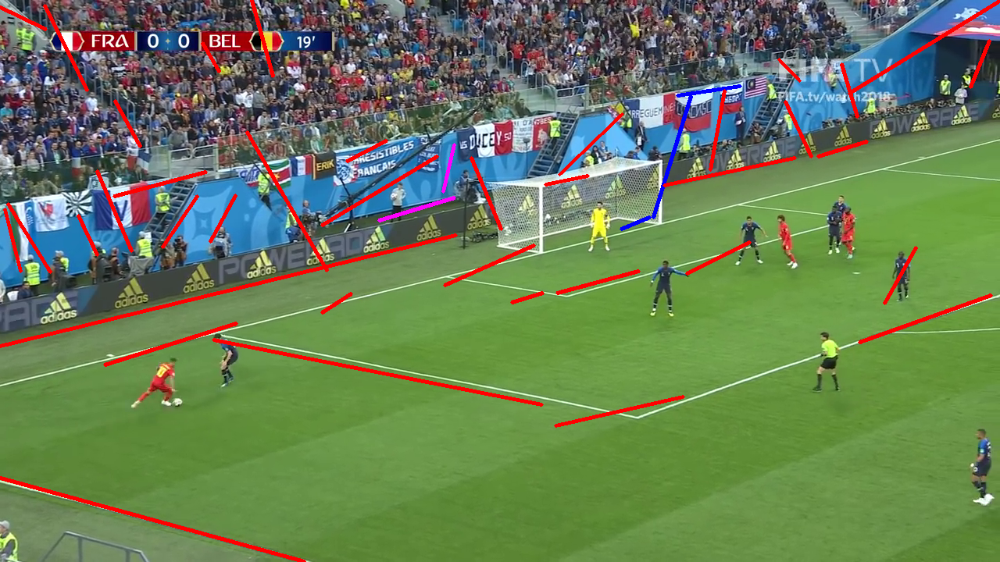

In [93]:
tmp = first
lines_mat = LineSegmentDetector(frame=img)
            # lines_mat.extract_lines(thresh_lb=lines.lower_bound, thresh_ub=lines.upper_bound, field=img)
lines_mat.lsd(max_distance_apart=lines.max_distance_apart, min_length=lines.min_length)
lines_mat.find_corners(max_distance_apart=lines.corner_max_distance_apart)
field_lines = lines_mat.classify_lines()

# Draw lines if found
if field_lines:
    for line_type in field_lines.keys():
        if line_type == 'boundary':
            colour = lines.output_boundary_line_colour
        elif line_type == 'goal_area':
            colour = lines.output_goal_area_line_colour
        elif line_type == 'center':
            # pass
            colour = lines.output_center_line_colour
        else:
            # pass
            colour = lines.output_undefined_line_colour

        for line in field_lines[line_type]:
            pt1, pt2 = line.to_cv_line()
            cv2.line(tmp, pt1=pt1, pt2=pt2, color=colour, thickness=3)
cv2_imshow(tmp)
# cv2.putText(frame, text=lines.name, org=(10, 30), fontFace=cv2.FONT_HERSHEY_DUPLEX, fontScale=1, color=(0, 0, 255))
# cv2.imshow(DEBUG_WINDOW_NAME, frame)

In [84]:
lines.

[255, 0, 0]

In [78]:
fld = cv2.ximgproc.createFastLineDetector()
fld.detect(cv2.cvtColor(lines_mat.frame, cv2.COLOR_BGR2GRAY))[0]

array([[24.031145  , 12.965598  ,  9.869347  ,  0.14431362]],
      dtype=float32)

In [0]:
cv2.ximgproc.createFastLineDetector()

In [0]:

def find_closest_people(name,thresh):

  # img = cv2.imread('frames/'+name)
  outputs = predictor(img)
  classes=outputs['instances'].pred_classes.cpu().numpy()
  bbox=outputs['instances'].pred_boxes.tensor.cpu().numpy()
  ind = np.where(classes==0)[0]
  person=bbox[ind]
  midpoints = [mid_point(img,person,i) for i in range(len(person))]
  num = len(midpoints)
  dist= compute_distance(midpoints,num)
  p1,p2,d=find_closest(dist,num,thresh)
  img = change_2_red(img,person,p1,p2)
  cv2.imwrite('frames/'+name,img)
  return 0

In [18]:
predictions["instances"].to("cpu").pred_classes.cpu().numpy()

array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0, 32,  0])

In [0]:
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

In [0]:

cfg = get_cfg()
cfg.merge_from_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"
predictor = DefaultPredictor(cfg)
outputs = predictor(im)

v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2.imshow(v.get_image()[:, :, ::-1])

AssertionError: ignored